In [124]:
import pandas as pd
import folium
from folium import Map, Marker
from geopy import distance
import matplotlib.pyplot as plt
import seaborn as sns

## Pre-Processing
- `find_hidden.py` 
- merge multiple csv
- parse kimset db to get more verbose csv *(e.g device type, Hidden SSId)*

**Capabilities**
- merge multiple csvs together
- draw on map traversed areas
- map devices distanced by 10-20 meters
- group together devices on map - https://python-visualization.github.io/folium/quickstart.html#Vincent/Vega-and-Altair/VegaLite-Markers

**Interogating the data**
- [ ] differences in devices (clients, cars, watches, headphones, phone hotspots, APs, phones, TVs)
- [X] encryption protocol ratio (how many open networks, WPA2, WEP?, has WPS enabled?)
- [X] most used channels
- [ ] what are the most common SSIDs based on area
- [ ] device freq distribution
- [ ] heat map based on freq of devices
- [X] map MAC adresses to device type / manufecturer (assign color 4 viz based on that)

In [132]:
# removed this from wiglecsv: WigleWifi-1.4,appRelease=Kismet202208R1,model=Kismet,release=2022.08.R1,device=kismet,display=kismet,board=kismet,brand=kismet
csvd = pd.read_csv('/home/vlaghe/proj/warpi/data/buc2run/buc2runweli-20230114-14-53-28-1.wiglecsv')
# csvd = pd.read_csv('/home/vlaghe/proj/warpi/data/steakrun/steakrun-20230117-15-33-38-1.wiglecsv')
#csvd.describe()  # summarry of data
csvd.sample(10)  # show 10 random sameples 
#csvd.AuthMode.unique() # get uniq vals 4 one column
#csvd.drop_duplicates(subset='MAC') # drop duplicates based on col

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type
31364,8C:CE:4E:41:7F:56,NaN,[ESS],2023-01-14 16:46:36,0,-73,44.452948,26.099073,74.9,0,WIFI
5381,C2:0B:5A:FD:FE:45,Galaxy A03s8339,[WPA2-PSK-CCMP][ESS],2023-01-14 15:03:36,6,-71,44.443089,26.119107,109.0,0,WIFI
25337,EE:F8:79:A3:23:E2,DUO,Misc [LE],2023-01-14 16:24:27,0,0,44.428575,26.052789,112.1,0,BLE
28949,CC:2D:21:A3:B9:E1,Not the Wi-Fi u are looking for,[WPA-PSK-CCMP] [WPA2-PSK-CCMP][ESS],2023-01-14 16:38:37,6,-77,44.434314,26.055585,69.1,0,WIFI
20904,7D:04:3C:40:5D:76,7D:04:3C:40:5D:76,Misc [LE],2023-01-14 16:21:50,0,0,44.429151,26.053456,96.8,0,BLE
24682,55:AE:70:72:AC:CF,55:AE:70:72:AC:CF,Misc [LE],2023-01-14 16:24:17,0,0,44.428691,26.053162,99.2,0,BLE
3516,14:22:33:01:20:C8,DIGI_0120c8,[WPA2-PSK-CCMP][ESS],2023-01-14 15:02:07,8,-71,44.447114,26.122817,103.5,0,WIFI
17277,88:DC:96:90:DB:1A,NaN,[ESS],2023-01-14 15:25:31,1,-71,44.432862,26.070536,77.8,0,WIFI
14292,D0:90:4A:6D:23:A6,D0:90:4A:6D:23:A6,Misc [LE],2023-01-14 15:18:32,0,0,44.434698,26.098380,68.8,0,BLE
10043,9C:C1:72:1A:E8:C3,Clicknet-E8BA,[WPA2-PSK-CCMP][ESS],2023-01-14 15:11:00,1,-75,44.437191,26.101805,84.0,0,WIFI


## ️🗺️ Mapping Nets
- Mapping the route
- The most busy areas
    - clustering
        -
    - heatmap
- 

In [163]:
# Manually pick scope of map
# mmap = folium.Map(
#     location   = [44.462588, 26.121101],
#     zoom_start = 14
# )
# to this instead?
mmap = folium.Map( 
    location=[ csvd.CurrentLatitude.mean(), csvd.CurrentLongitude.mean() ], 
    zoom_start=14
)

# Denote w a line the path traversed 
# during wardriving
# NOTE: strange lines prob due to GPS syncing
# find a way to clean the data when this happens
folium.PolyLine(
    csvd[["CurrentLatitude", "CurrentLongitude"]].values.tolist(),
    line_opacity = 0.2,
    weight = 2
).add_to(mmap)

mmap
#csvd.sample(10)  # summarry of data

In [175]:
# https://github.com/python-visualization/folium/blob/main/examples/MarkerCluster.ipynb
mmap = folium.Map( 
    location=[ csvd.CurrentLatitude.mean(), csvd.CurrentLongitude.mean() ], 
    zoom_start=14
)
folium.PolyLine(
    csvd[["CurrentLatitude", "CurrentLongitude"]].values.tolist(),
    line_opacity = 0.2,
    weight = 2
).add_to(mmap)

# First only map unique devices
df = csvd.drop_duplicates("MAC")
print(len(df))
#df.dropna() # can also drop none vals

# create bigger circle
# folium.Circle(
#     radius=5000,
#     location=[41,29],
#     color='crimson',
#     fill=False
#     #fill_color='red'
# ).add_to(mmap)


marker_cluster = MarkerCluster().add_to(mmap)

for i in range(len(df)):

    lat  = csvd["CurrentLatitude"][i]
    lon  = csvd["CurrentLongitude"][i]
    ssid = csvd["SSID"][i]
    rssi = csvd["RSSI"][i]
        
    folium.Marker( 
        location=[lat, lon],
        popup = ["SSID: ", ssid, "RSSI", rssi],
        icon=folium.Icon(icon="wifi", prefix="fa") 
    ).add_to(marker_cluster)

mmap

10493


## 📊 Some Stats 

### Most Used SSID Names

I wanted to take a look @ the most common names when it comes to choosing SSIDs

From the perspective of an attacker / WiFi assessment this data can be quite fruitful, given that you can map the most used SSIDs in an area & use that to lunch further attacks for initail access *(e.g rogue AP, phising)* 


> **NOTE**: this is calculated from all of my dataset => the frequency @ which SSID names are counted are directly correlated with the GPS coords => if I stayed more in 1 place, the SSIDs in that area will show more times than others 

- [ ] Open VS Hidden SSIDs

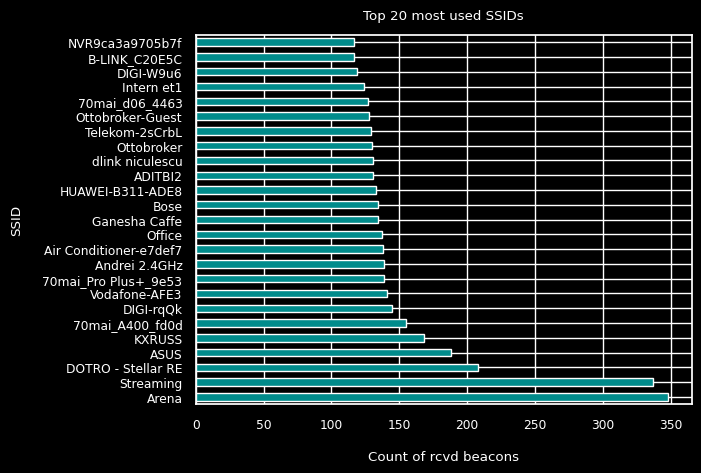

In [459]:
# Most used SSID names 

# NOTE: 
#   AndroidAP1757 - prob my phone
#   Denisa - Eli car?
#   MiVue  - Eli car camera?
# NOTE: if so, I should take into account location & not only count how many times it was seen
regex = r"^([0-9A-Fa-f]{2}[:-]){5}([0-9A-Fa-f]{2})$"    # filter out MAC addr
SSIDs = csvd[csvd.SSID.str.match(regex)==False].SSID
counts = SSIDs.value_counts()

# drop the first 2 columns (my phone hotspot & car camera)
# counts = counts.iloc[2:]    
# counts.head(10) # | counts.index

TOP = 25

# Style plot
plt.style.use('dark_background')
counts[:TOP].plot(kind='barh', color='darkcyan')
sns.set(font_scale=0.8)
plt.ylabel("SSID", labelpad=14)
plt.xlabel("Count of rcvd beacons", labelpad=14)
plt.title("Top 20 most used SSIDs", y=1.02);
# plt.grid(visible=True, color='aqua', alpha=0.1, linestyle='-', linewidth=2)

# total unique SSIDs
uniq_ssids = csvd.SSID.unique()
#.sort_index(ascending=False).sort_values(ascending=False)
# sort alphabetically: .sort_index(ascending=True)
# sort by value: .sort_values(ascending=False)
# get % count: .value_counts(normalize=True)

## TODO: top x Open wifi SSIDs

### WiFI Access Points Encryption
- maybe better do this with by processing the sqlite3 db yourslef  (see "kismet.device.base.crypt": "Open")
- [more info on wifi sec prot](https://www.linkedin.com/pulse/wifi-security-basics-hacking-cracking-protecting-maxwell-francis)
- interpret [Wifi security info](https://www.acrylicwifi.com/en/blog/about-wpa-psk-tkip-ccmp-wi-fi-security-information/)
- [WPA-2 PSK Vulnerabilities](https://www.encryptionconsulting.com/is-wpa2-psk-vulnerable/)
- WPS enabled?

2431 5405


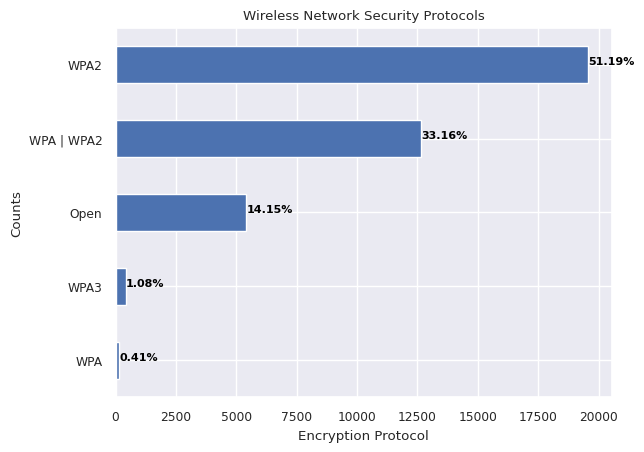

In [461]:
# csvd.AuthMode.value_counts().plot(kind='bar', color='darkcyan') 
uAuths = csvd.AuthMode.unique()

# Open = [ESS] and [WPS][ESS]
# WEP  = [WEP][ESS]
# WPA  = [WPA-PSK-CCMP][ESS] 
# WPA2 = [WPA2-PSK-CCMP][WPS][ESS] 
#        [WPA2-PSK-CCMP][ESS]
#        [WPA2-EAP-CCMP+TKIP][ESS]
# WPA3 = [WPA3-PSK-CCMP][ESS]
# Mixed Mode = [WPA-PSK-CCMP+TKIP][WPA2-PSK-CCMP+TKIP][WPS][ESS]
#              [WPA-PSK-CCMP+TKIP][WPA2-PSK-CCMP+TKIP][ESS]
#              [WPA-EAP-CCMP+TKIP][WPA2-EAP-CCMP+TKIP][ESS]

# Filter networks based on encryption protocols
bluetooth = csvd[csvd.AuthMode.str.match("Misc")]
open_nets = csvd.query("AuthMode == '[ESS]'")
uniq_open_ssids = open_nets.SSID.unique()

wpa_nets  = csvd[csvd.AuthMode.str.match("^\[WPA-[^\s]*\]\[ESS\]$")]
wpa2_nets = csvd[csvd.AuthMode.str.match("\[WPA2-")]
wpa3_nets = csvd[csvd.AuthMode.str.match("\[WPA3-")]
wpa_nd_wpa2 = csvd[csvd.AuthMode.str.contains("(?=.*WPA)+\s(?=.*WPA2)")]
print(len(open_nets.drop_duplicates(subset='MAC')), len(open_nets))

# Security Type Comparison
# create a dict & df from data
data = {
    'Open': len(open_nets),
    'WPA': len(wpa_nets),
    'WPA2': len(wpa2_nets),
    'WPA3': len(wpa3_nets),
    'WPA | WPA2': len(wpa_nd_wpa2)
}
df = pd.DataFrame.from_dict(data, orient='index', columns=['Count']).sort_values(by='Count')
df['Percentage'] = df['Count'] / df['Count'].sum()*100

# plot & style
ax = df['Count'].plot(kind='barh')
plt.title('Wireless Network Security Protocols')
plt.xlabel('Encryption Protocol')
plt.ylabel('Counts')

# add % as bar labels
for i in range(len(df)):
    ax.text(
        df.loc[df.index[i],'Count'] + 10, i, f'{df.loc[df.index[i],"Percentage"]:.2f}%',
        color="black", fontweight='bold', fontsize=8
    )
plt.show()

## Hidden VS Open Nets
- https://ethicalhackingblog.com/uncovering-hidden-ssids/
- https://kalitut.com/hidden-wifi-network-name/
- https://null-byte.wonderhowto.com/how-to/map-wardriving-data-with-jupyter-notebook-0202701/
- https://github.com/pect0ral/kismet_parser

Used `find_hidden.py` util script to generate the CSV:
```bash
echo "MAC,Channel,Freq" > hidd_nets.csv
python find_hidden.py data/buc2run/buc2run.json >> hidd_nets.csv
```


,Hidden,Count,Percentage
0,Open,4645,96.59%
1,Hidden,164,3.41%


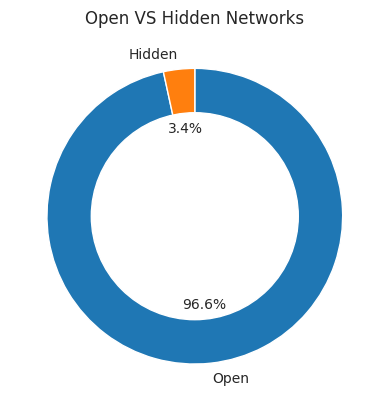

In [131]:
# maybe I could find hidden nets by just looking @ csvd.SSID == NaN
# could be interesting to look @ manuf & who does this by default
# hidd_nets = pd.read_csv('/home/vlaghe/proj/warpi/hidd_nets.csv', sep="-")
hidd_nets = pd.read_csv('/home/vlaghe/proj/warpi/test_hidd.csv', sep="-")
# display(hidd_nets.head())


grouped = hidd_nets.groupby("Hidden")["MAC"].size().reset_index(name="Count")
grouped["Percentage"] = (
    grouped["Count"] / grouped["Count"].sum()
).apply(lambda x: "{:.2%}".format(x))
grouped['Hidden'] = grouped['Hidden'].replace({0:'Open', 1:'Hidden'})
display(grouped)


# TODO: Find a better way to viz this
# Create a figure and axes
fig, ax = plt.subplots()

# Create the donut chart
ax.pie(
    grouped["Count"], labels=grouped["Hidden"], 
    autopct='%1.1f%%', startangle=90, counterclock=False, wedgeprops={"edgecolor":"white"}
)

# Add a title
plt.title('Open VS Hidden Networks')

# Add a circle to the center to make it a donut chart
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Display the chart
plt.show()

### Frequently Used Channels

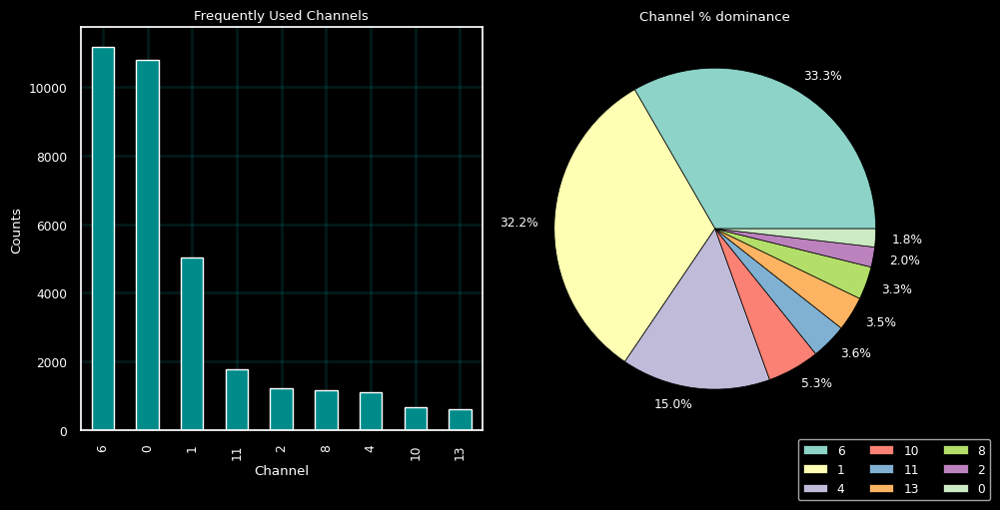

In [418]:
uniq_channels = csvd.Channel.unique()
counts = csvd.Channel.value_counts()
percs  = csvd.Channel.value_counts(normalize=True).mul(100).round(1)
# create a new df: channels = pd.concat([counts, percs], axis=1, keys=['count', 'perc'])

plt.figure(figsize=(10,5))

## Freq used channs
plt.subplot(1, 2, 1)
plt.title("Frequently Used Channels");
plt.style.use('dark_background')
plt.ylabel("Counts")
plt.xlabel("Channel")
plt.grid(visible=True, color='aqua', alpha=0.1, linestyle='-', linewidth=2)
counts.plot(kind='bar', color='darkcyan')
# or 1 liner -?
# csvd.Channel.value_counts().plot(kind='bar', color='darkcyan') 

## Channel % dominance
plt.subplot(1, 2, 2)
plt.title("Channel % dominance");
plt.pie(
    counts, labels=percs.astype(str) + '%', 
    labeldistance=1.1, 
    wedgeprops = {'linewidth' : 0.5, 'edgecolor' : 'black'}
)
plt.legend(uniq_channels, bbox_to_anchor=(1.2, -0.1), ncol=3, loc='right')
plt.tight_layout()

### Mapping MACs 2 Manufacturers
- maybe get initial registration date ?
- len(uniq_vendors) != uniq_devs.Vendor.nunique() WHYYYY

In [462]:
from manuf import manuf
p = manuf.MacParser(update=True)

# Get a list of all the identified vendors
# from the MAC addresses provided
def MAC2Vendor(macs: list, uniq : bool = False):
    vendors = []
    for MAC in macs:
        vendor = p.get_all(MAC)
        
        if uniq:
            if vendor.manuf not in vendors:
                vendors.append(vendor.manuf)
        else:
           vendors.append(vendor.manuf)
        
                # try to identity it from SSID
    #     if vendor.manuf == None:
    #         ssid = uniq_devs.loc[uniq_devs.MAC.str.match(MAC)].SSID
    #         print(MAC, ssid) 
    return vendors

Uniq Vendors: 136


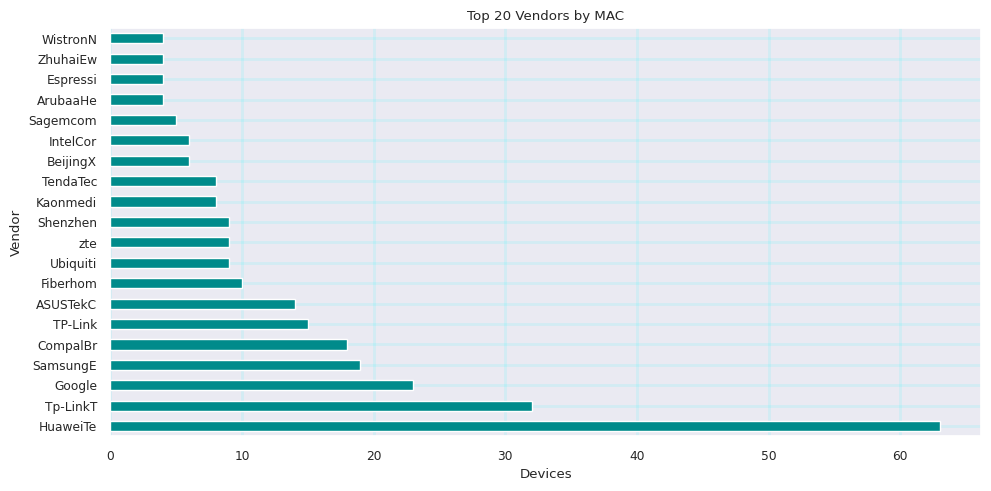

In [463]:
uniq_devs    = csvd.drop_duplicates(subset='MAC').copy()
uniq_vendors = MAC2Vendor(uniq_devs.MAC.tolist(), True)
print(f"Uniq Vendors: {len(uniq_vendors)}")
MAX_V = 20

# Create new Vendor column in DataFrame
vendors = MAC2Vendor(uniq_devs.MAC.tolist())
uniq_devs['Vendor'] = pd.Series(vendors)

# Plot top 20 vendors
uniq_devs.Vendor.value_counts()[:MAX_V].plot(kind='barh', color='darkcyan', figsize=(10,5)) 
plt.title(f"Top {MAX_V} Vendors by MAC");
plt.style.use('dark_background')
plt.ylabel("Vendor")
plt.xlabel("Devices")
plt.grid(visible=True, color='aqua', alpha=0.1, linestyle='-', linewidth=2)
plt.tight_layout()

In [464]:
print(len(uniq_vendors), uniq_vendors)
print(uniq_devs.Vendor.nunique(), uniq_devs.Vendor.unique())

136 [None, 'BeijingX', 'Tp-LinkT', 'SamsungE', 'zte', 'D-Link', 'Sagemcom', 'ASUSTekC', 'WistronN', 'GreeElec', 'ZhuhaiEw', 'TP-Link', 'Routerbo', 'MercuryC', 'HuaweiTe', 'Google', 'Fiberhom', 'Ubiquiti', 'ZyxelCom', 'ArubaaHe', 'peikerac', 'ChinaDra', '70mai', 'Continen', 'TexasIns', 'Shenzhen', 'XiaomiCo', 'TendaTec', 'Kaonmedi', 'NetcoreT', 'Alpsalpi', 'Chongqin', 'IntelCor', 'Cisco', 'Guangzho', 'Espressi', 'D-LinkIn', 'LGElectr', 'SichuanA', 'HonHaiPr', 'Cisco-Li', 'BelkinIn', 'u-blox', 'EnGenius', 'HuaweiDe', 'Shanghai', 'Hangzhou', 'LGInnote', 'Visteon', 'MediaTek', 'TRENDnet', 'QuantaMi', 'AVMAudio', 'Viessman', 'XIAOMIEl', 'MurataMa', 'CompalBr', 'Fn-LinkT', 'HewlettP', 'CloudNet', 'HunanFn-', 'Netgear', 'LiteonTe', 'Whirlpoo', 'TuyaSmar', 'Tremol', 'LierdaSc', 'MitsumiE', 'Longchee', 'EardaTec', 'Raspberr', 'HP', 'AzureWav', 'Microsof', 'ZhenShiI', 'HongKong', 'UbeeInte', 'Motorola', 'Synology', 'Phorus', 'devolo', 'HangZhou', 'Sonos', 'Philips', 'SAMJIN', 'TCTmobil', 'Hitron

## HeatMaps

In [488]:
from folium.plugins import HeatMap

heatmap = folium.Map(
    location   = [44.462588, 26.121101],
    zoom_start = 14
)


csvd.sample(10)


# Step 3: Use the dataframe to add markers to the map
for i in range(0, 10):
    folium.CircleMarker(
        location=[csvd.iloc[i]['CurrentLatitude'], csvd.iloc[i]['CurrentLongitude']],
        radius=5, color='#3186cc', fill_color='#3186cc',
    ).add_to(heatmap)


# Step 4: Add a marker on the heatmap to indicate the location of the most busy areas
busy_loc = csvd.groupby(['CurrentLatitude','CurrentLongitude']).count().sort_values(by='SSID',ascending=False)
most_busy = busy_loc.head(1)

display(busy_loc.head(3))
folium.Marker(location=[most_busy.index[0][0],most_busy.index[0][1]],
              icon=folium.Icon(color='red'),
              popup='<strong> most busy location </strong>').add_to(heatmap)

heatmap

# lats_longs_weight = list(map(list, zip(csvd["CurrentLatitude"],
#                           csvd["CurrentLongitude"],
#                           population_data["POPESTIMATE2019"]
#                          )
#                )
#            )
# lats_longs_weight[:5]
# HeatMap(lats_longs_weight).add_to(map_obj)

,,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,AltitudeMeters,AccuracyMeters,Type
CurrentLatitude,CurrentLongitude,,,,,,,,,
44.461667,26.117338,171,143,171,171,171,171,171,171,171
44.462029,26.118901,129,114,129,129,129,129,129,129,129
44.462467,26.119115,129,113,129,129,129,129,129,129,129


## Devices by distance

In [164]:
# base - (lat, lon)[d0]
# dist(d0, dx) - iterate dx until dist > 10 meters
#   dist(d0, d1 ) - 0.5 m
#   dist(d0, d5 ) - 3.2 m
#   dist(d0, d10) - 5.7 m
#   dist(d0, d13) - 7.9 m
#   dist(d0, d17) - 10  m
# change base to d17

# reset map
mmap = folium.Map(
    location   = [44.462588, 26.121101],
    zoom_start = 14
)

init_dev = (csvd["CurrentLatitude"][0], csvd["CurrentLongitude"][0])
MAX_DIST = 50

for i in range(1, 7000):
    lat  = csvd["CurrentLatitude"][i]
    lon  = csvd["CurrentLongitude"][i]
    ssid = csvd["SSID"][i]
    dist = distance.distance(init_dev, (lat, lon)).meters
        
    if dist > MAX_DIST:
#         print(f"traversed {MAX_DIST} meters: {init_dev} - {(lat, lon)}")
        folium.Marker( 
            location=[lat, lon],
            popup=ssid,
            icon=folium.Icon(icon="wifi", prefix="fa") 
        ).add_to(mmap)
        
#         print(f"changing init_dev to: {(lat, lon)}")
        init_dev = (lat, lon)
mmap

## Visualizing Devices By Type

In [76]:
# Mapping Smartphones


array(['WIFI', 'BLE', 'BT'], dtype=object)

## `CHEATSHEET`

In [465]:
# import pandas as pd
# import seaborn as sns

# df = sns.load_dataset("tips")
# x, y, hue = "day", "proportion", "sex"
# hue_order = ["Male", "Female"]

# (df[x]
#  .groupby(df[hue])
#  .value_counts(normalize=True)
#  .rename(y)
#  .reset_index()
#  .pipe((sns.barplot, "data"), x=x, y=y, hue=hue))


# from matplotlib import pyplot as plt

# # First plot
# ax = plt.subplot()
# plt.scatter( ... ) # Scatter plot 1 data
# plt.title( ... )
# plt.show()

# # Second plot
# ax = plt.subplot()
# plt.scatter( ... ) # Scatter plot 2 data
# plt.title( ... )
# plt.show()

# # Third plot
# # Rinse and repeat

# # EVEN BETTER !!

# fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns
# df1.plot(..., ax=ax1)
# df2.plot(..., ax=ax2)

# plt.tight_layout()  # Optional ... often improves the layout 

In [ ]:

# # Create a figure and axes
# fig, ax = plt.subplots()

# # Create the donut chart
# ax.pie(
#     grouped["Count"], labels=grouped["Hidden"], 
#     autopct='%1.1f%%', startangle=90, counterclock=False, wedgeprops={"edgecolor":"white"}
# )

# # Add a title
# plt.title('Open VS Hidden Networks')

# # Add a circle to the center to make it a donut chart
# centre_circle = plt.Circle((0,0),0.70,fc='white')
# fig = plt.gcf()
# fig.gca().add_artist(centre_circle)

# # Display the chart
# plt.show()